In [1]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

In [2]:
def rotate_bound(image, angle):
    # grab the dimensions of the image and then determine the
    # center
    (h, w) = image.shape[:2]
    (cX, cY) = (w // 2, h // 2)
 
    # grab the rotation matrix (applying the negative of the
    # angle to rotate clockwise), then grab the sine and cosine
    # (i.e., the rotation components of the matrix)
    M = cv2.getRotationMatrix2D((cX, cY), -angle, 1.0)
    cos = np.abs(M[0, 0])
    sin = np.abs(M[0, 1])
 
    # compute the new bounding dimensions of the image
    nW = int((h * sin) + (w * cos))
    nH = int((h * cos) + (w * sin))
 
    # adjust the rotation matrix to take into account translation
    M[0, 2] += (nW / 2) - cX
    M[1, 2] += (nH / 2) - cY
 
    # perform the actual rotation and return the image
    return cv2.warpAffine(image, M, (nW, nH))

In [3]:
def correct_perspective(img, rect):

    # now that we have our rectangle of points, let's compute
    # the width of our new image
    (tl, tr, br, bl) = rect
    widthA = np.sqrt(((br[0] - bl[0]) ** 2) + ((br[1] - bl[1]) ** 2))
    widthB = np.sqrt(((tr[0] - tl[0]) ** 2) + ((tr[1] - tl[1]) ** 2))

    # ...and now for the height of our new image
    heightA = np.sqrt(((tr[0] - br[0]) ** 2) + ((tr[1] - br[1]) ** 2))
    heightB = np.sqrt(((tl[0] - bl[0]) ** 2) + ((tl[1] - bl[1]) ** 2))

    # take the maximum of the width and height values to reach
    # our final dimensionsconda 
    maxWidth = max(int(widthA), int(widthB))
    maxHeight = max(int(heightA), int(heightB))

    # construct our destination points which will be used to
    # map the screen to a top-down, "birds eye" view
    dst = np.array([
        [0, 0],
        [maxWidth - 1, 0],
        [maxWidth - 1, maxHeight - 1],
        [0, maxHeight - 1]], dtype = "float32")

    M = cv2.getPerspectiveTransform(rect, dst)


    warp = cv2.warpPerspective(img, M, (maxWidth, maxHeight))
    return warp

## Correcting perspective of targets

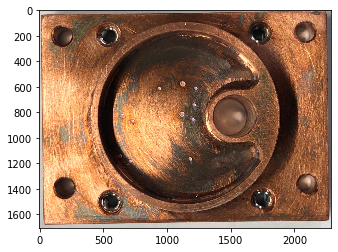

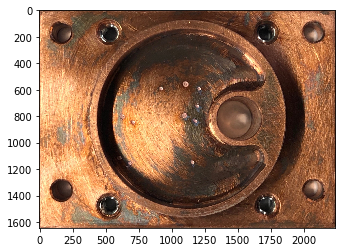

In [4]:
trace1 = cv2.imread('target_picture.jpg',1)
trace1 = cv2.cvtColor(trace1, cv2.COLOR_BGR2RGB)

rect1 = np.array([[13,35],[2251,3],[2273,1647],[35,1677]], dtype = "float32")
warp1 = correct_perspective(trace1, rect1)
warp1 = rotate_bound(warp1, 0)
trace1 = rotate_bound(trace1, 0)

cv2.imwrite("trace1.jpg", cv2.cvtColor(warp1, cv2.COLOR_RGB2BGR))

plt.figure()
plt.imshow(trace1)

plt.figure()
plt.imshow(warp1)

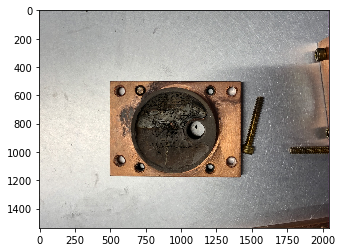

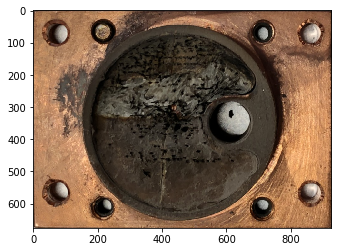

In [5]:
target = cv2.imread('IMG_4511.JPEG',1)
target = cv2.cvtColor(target, cv2.COLOR_BGR2RGB)

rect_target = np.array([[366,498],[1035,500],[1034,1427],[358,1425]], dtype = "float32")
warp_target = correct_perspective(target, rect_target)
warp_target = rotate_bound(warp_target, -90)
target = rotate_bound(target, -90)

cv2.imwrite("target.jpg", cv2.cvtColor(warp_target, cv2.COLOR_RGB2BGR))

plt.figure()
plt.imshow(target)

plt.figure()
plt.imshow(warp_target)

## Calculating Transformation Matrix

In [6]:
# start top left, clockwise
rect0 = np.array([[685,1157],[1157,1147],[1207,595],[921,591]], dtype = 'float32')
rectmirr0 = np.array([[5000,5000],[5000,0],[-4000,0],[-4000,3000]], dtype = 'float32')

True

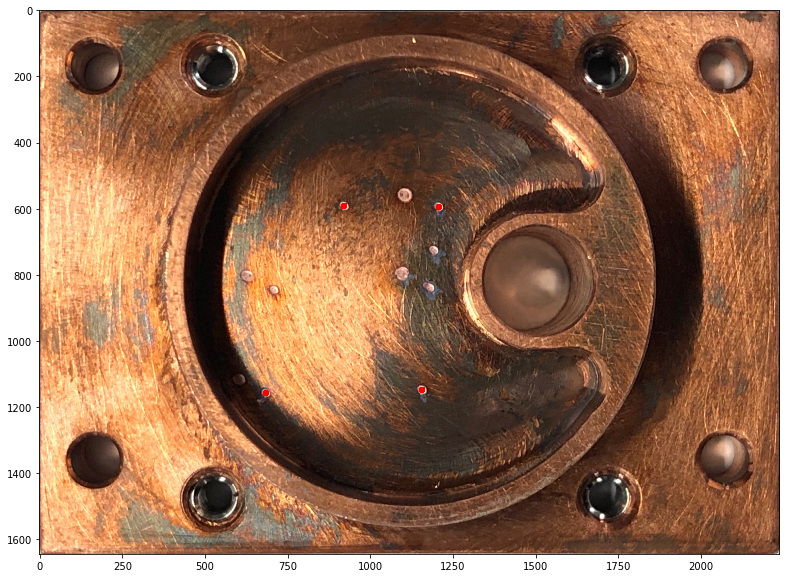

In [7]:
image_transform = warp1.copy()
fig, ax = plt.subplots(figsize = (15,10))
[cv2.circle(image_transform, tuple(c), 10, (255,0,0), -1) for c in rect0]
ax.imshow(image_transform)
cv2.imwrite("alignment.jpg", cv2.cvtColor(image_transform, cv2.COLOR_RGB2BGR))

In [8]:
np.dot(cv2.getAffineTransform(rect0[:3],rectmirr0[:3]), [921,591,1])

array([-4164.32603713,  3039.33180539])

In [9]:
transform = cv2.getAffineTransform(rect0[:3],rectmirr0[:3])
transform_mirror_pixel = cv2.getAffineTransform(rectmirr0[:3], rect0[:3])

In [10]:
transform_mirror_pixel

array([[-5.55555556e-03, -9.44000000e-02,  1.18477778e+03],
       [ 6.13333333e-02,  2.00000000e-03,  8.40333333e+02]])

In [11]:
np.dot(transform_mirror_pixel, [-4164.32603713, 3039.33180539,1])

array([921., 591.])

## Detecting Target Edge

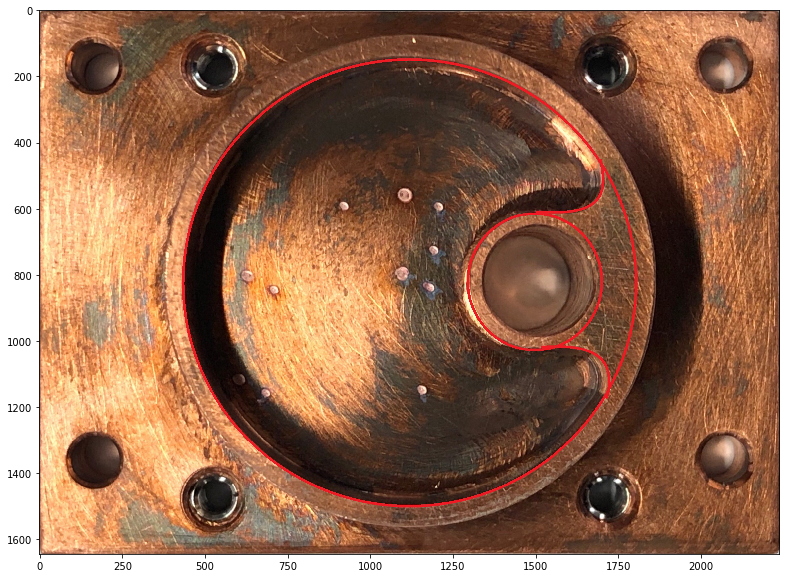

In [12]:
trace1_edge = cv2.imread('trace1_edge.jpg',1)
trace1_edge = cv2.cvtColor(trace1_edge, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(trace1_edge)

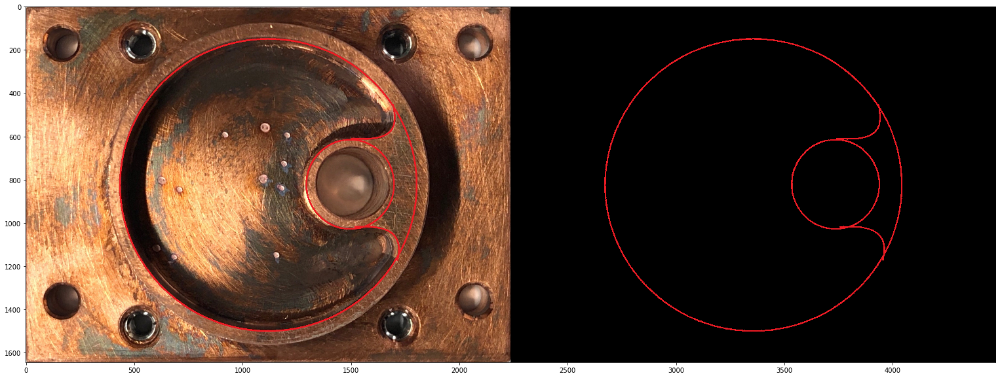

In [13]:
# red line has R=237,G=28,B=36
boundaries = [
    ([210, 0, 0], [255, 70, 70]),
]

# loop over the boundaries
for (lower, upper) in boundaries:
    # create NumPy arrays from the boundaries
    lower = np.array(lower, dtype = "uint8")
    upper = np.array(upper, dtype = "uint8")

    # find the colors within the specified boundaries and apply
    # the mask
    mask = cv2.inRange(trace1_edge, lower, upper)
    output = cv2.bitwise_and(trace1_edge, trace1_edge, mask = mask)

    # show the images
    fig, ax = plt.subplots(figsize = (30,10))
    ax.imshow(np.hstack([trace1_edge, output]))

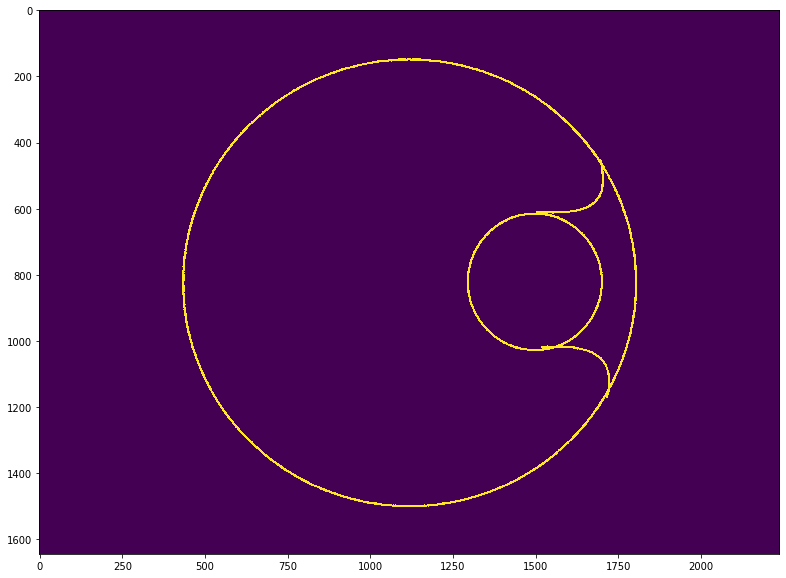

In [14]:
output_grey = cv2.cvtColor(output, cv2.COLOR_RGB2GRAY)
output_grey[output_grey != 0] = 255
fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(output_grey)

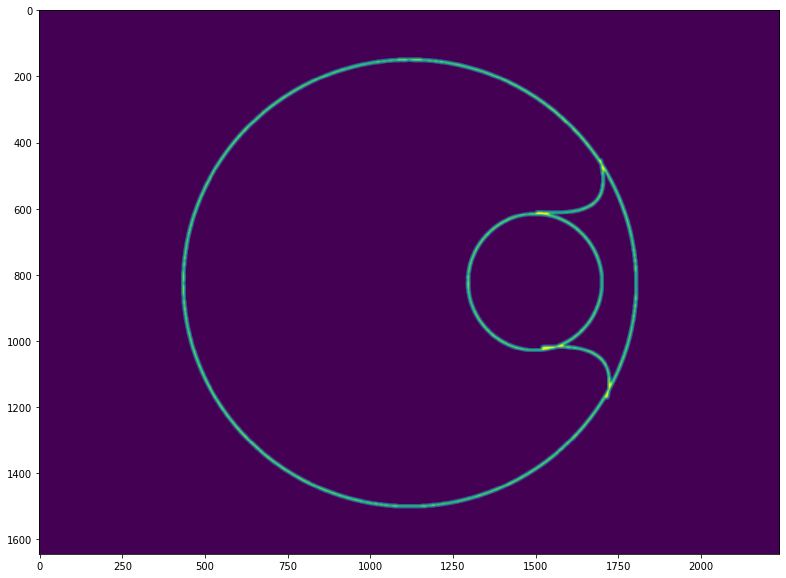

In [15]:
blur = cv2.blur(output_grey, (10,10))
fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(blur)

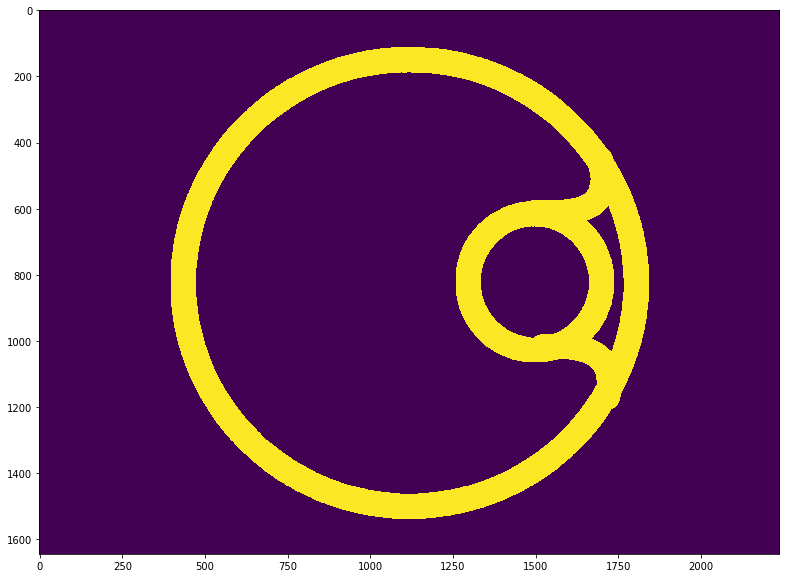

In [16]:
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(70,70))
dilated = cv2.dilate(output_grey, kernel)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(1,1))
eroded = cv2.erode(dilated, kernel)
fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(eroded)

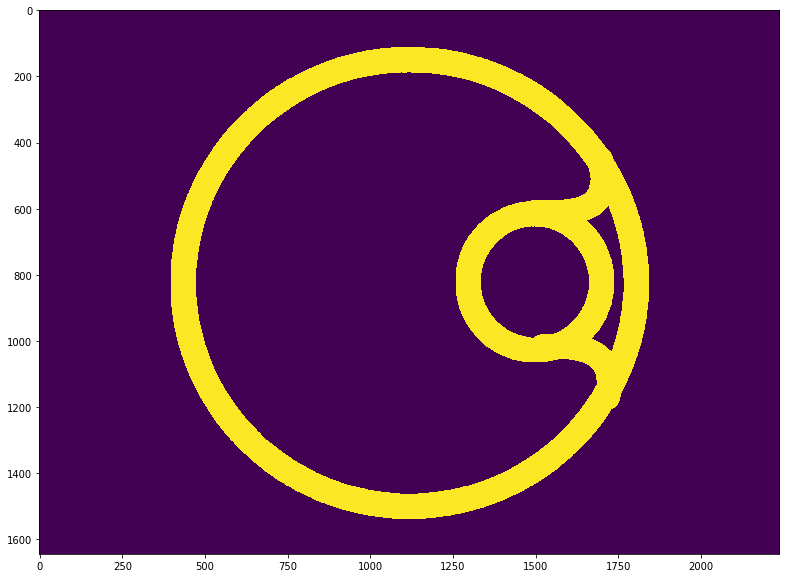

In [17]:
ret,thresh = cv2.threshold(eroded,10,255,cv2.THRESH_BINARY)

fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(thresh)

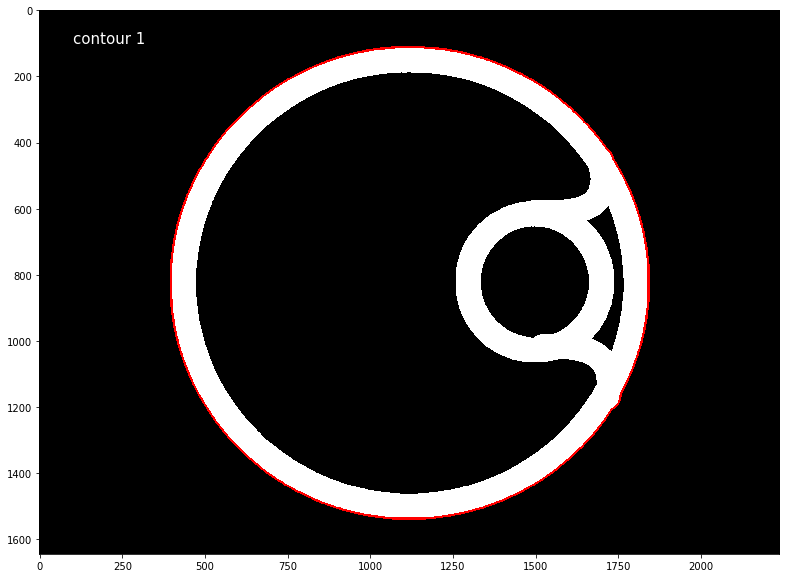

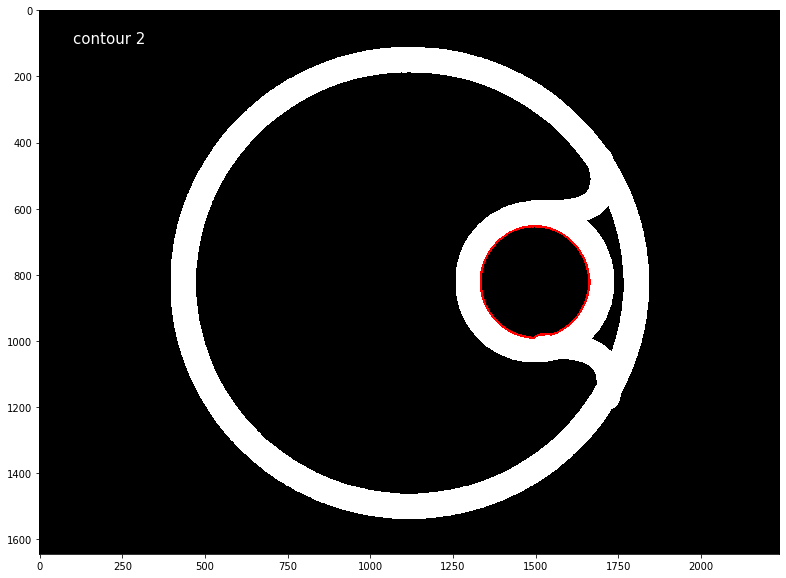

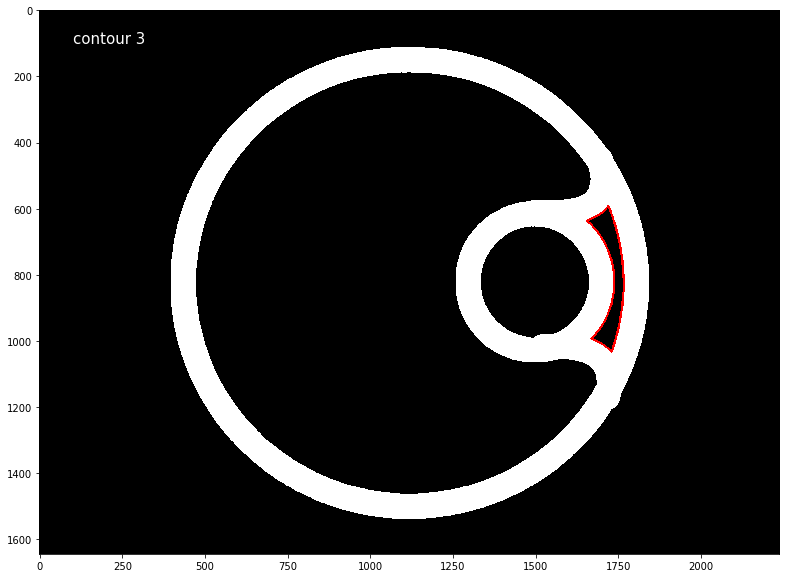

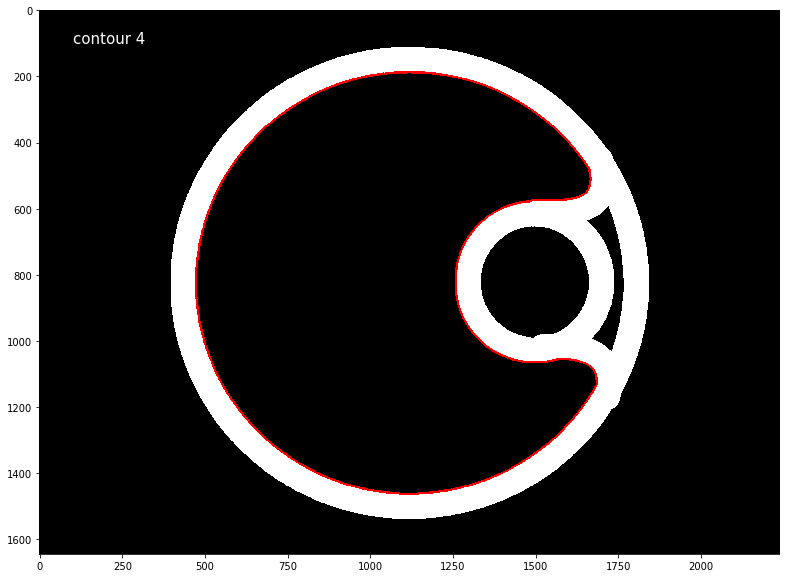

In [18]:
contours, hierarchy = cv2.findContours(thresh.copy(),cv2.RETR_CCOMP,cv2.CHAIN_APPROX_NONE )
for idc, contour in enumerate(contours):
    if len(contour) > 100:
        im = cv2.drawContours(cv2.cvtColor(thresh, cv2.COLOR_GRAY2RGB).copy(), contour, -1, (255,0,0), thickness = 5)
        fig, ax = plt.subplots(figsize = (15,10))
        # ax.imshow(output_grey)
        ax.imshow(im)
        ax.text(100,100, "contour {0}".format(idc+1), color = 'w', fontsize = 15)

True

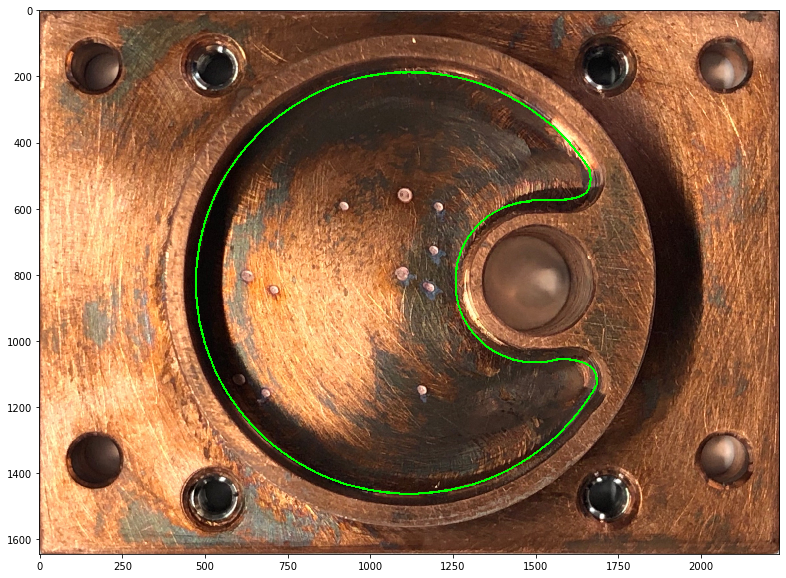

In [19]:
im = warp1.copy()
im = cv2.drawContours(im, [contours[-1]], -1, (0,255,0), thickness = 5)

fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(im)
cv2.imwrite("outer_edges.jpg", cv2.cvtColor(im, cv2.COLOR_RGB2BGR))

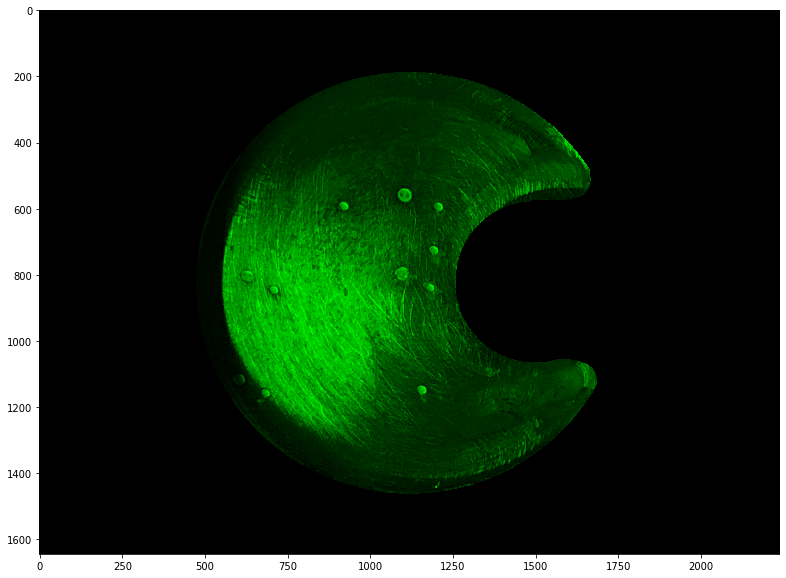

In [20]:
im = np.zeros(np.shape(output), dtype = 'float32')

im = cv2.drawContours(im, [contours[-1]], -1, (0,255,0), thickness = -1)
# cv2.fillPoly(im, pts = contours[3], color = (0,255,0))

cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(trace1_edge & im.astype(int))

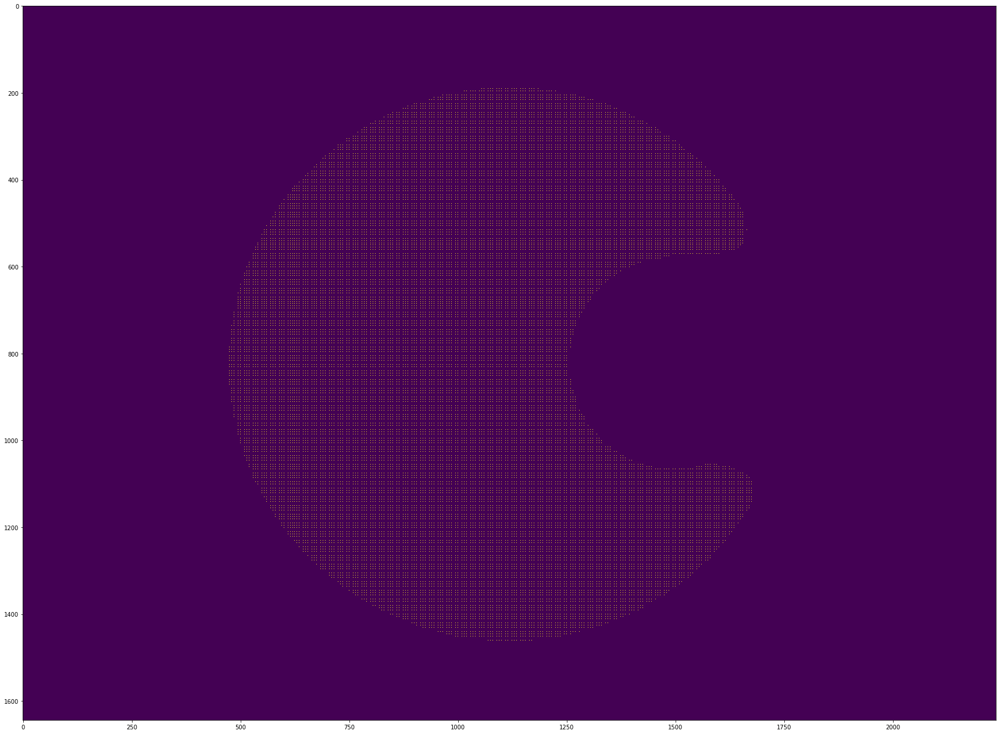

In [21]:
dpx = 5
im = cv2.drawContours(np.zeros(np.shape(output_grey)), [contours[-1]], -1, (255), thickness = -1)
grid = np.zeros(im.shape)
for idy in range(0,im.shape[0],dpx):
    for idx in range(0,im.shape[1],dpx):
        grid[idy,idx] = 125
fig, ax = plt.subplots(figsize = (30,25))
ax.imshow(im.astype(int) & grid.astype(int))

In [22]:
np.sum(grid[:,0] == 125)

329

Radius of target holder TlF area is 0.525" (13.34 mm). An ablation spot is roughly 15px x 15px (0.45mm x 0.45mm), and the radius 882px, roughly 60 ablations spots over the diameter of the target.

In [23]:
coords = np.where((im.astype(int) & grid.astype(int)) != 0)
yspots, xspots = coords
coords = np.vstack((xspots,yspots, np.ones(len(yspots)))).T

coords_ysweep = coords[coords[:,0].argsort()]
coords_xsweep = coords.copy()

In [24]:
coords_mirror = np.einsum('ij,kj->ki', transform, coords_xsweep)

Text(0, 0.5, 'y [motor steps]')

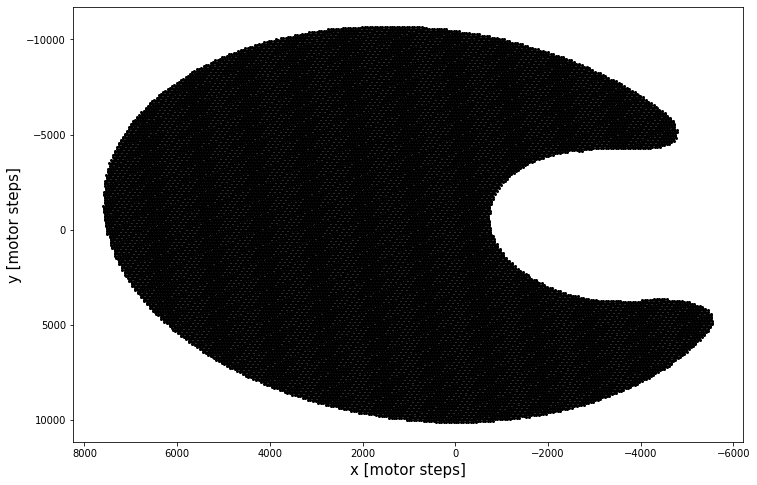

In [25]:
fig, ax = plt.subplots(figsize = (12,8))
ax.plot(coords_mirror[:,1], coords_mirror[:,0], 'k.', ms = 4)
ax.invert_yaxis()
ax.invert_xaxis()
ax.set_xlabel('x [motor steps]', fontsize = 15)
ax.set_ylabel('y [motor steps]', fontsize = 15)

In [26]:
sweepdata = coords_mirror.copy()
sweepdata = sweepdata[:,[1,0]]

In [27]:
import h5py
with h5py.File("ablation_sweeps_february2019.sweep_hdf5", "w") as f:
    dset = f.create_dataset('all_points', data = sweepdata.round().astype(int))

## Correction found from `Fluorescence Signals Target Scan.ipynb` in `CeNTREX-notebooks/rotational cooling/`
Pumping down in combination with the big bellows (iso160), causes the beamsource to shift slightly, necessitating a shift in mirror coordinates to compensate

In [28]:
coords_xsweep[:,0] += 270
coords_mirror = np.einsum('ij,kj->ki', transform, coords_xsweep)

sweepdata = coords_mirror.copy()
sweepdata[:,1]
sweepdata = sweepdata[:,[1,0]]

In [29]:
import h5py
with h5py.File("ablation_sweeps_february2019_corrected.sweep_hdf5", "w") as f:
    dset = f.create_dataset('all_points', data = sweepdata.round().astype(int))

## Taking a look at the used target and overlaying the grid on that

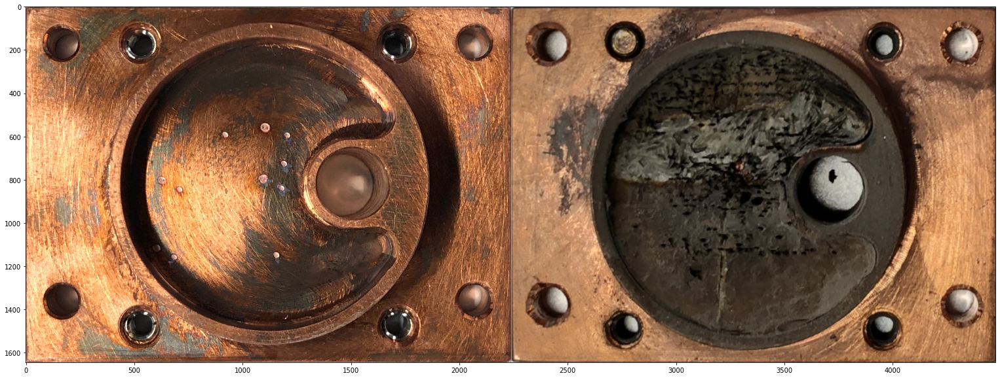

In [30]:
im = cv2.resize(warp_target, tuple(warp1.shape[:2][::-1]))
#     # show the images
fig, ax = plt.subplots(figsize = (30,10))
ax.imshow(np.hstack([warp1, im]))

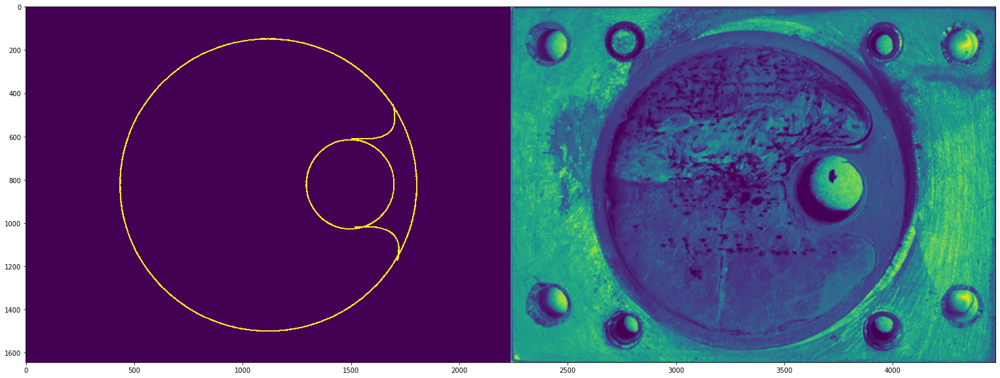

In [31]:
warp_target_resized = cv2.resize(warp_target, tuple(warp1.shape[:2][::-1]))
warp_target_resized_grey = cv2.cvtColor(warp_target_resized, cv2.COLOR_RGB2GRAY)

outline = output_grey.copy()

fig, ax = plt.subplots(figsize = (30,10))
ax.imshow(np.hstack([outline, warp_target_resized_grey]))

True

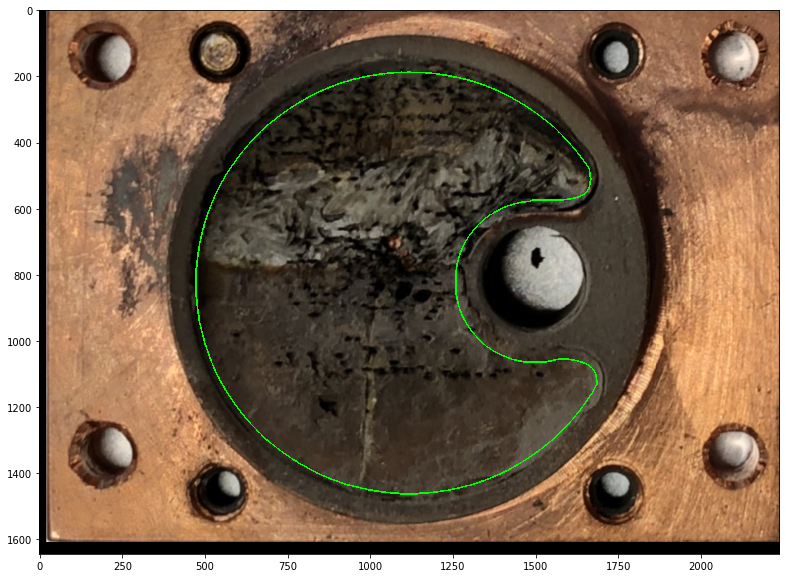

In [32]:
tx = +20
ty = -35
M = np.float32([[1,0,tx],[0,1,ty]])

im = warp_target_resized.copy()
im = cv2.warpAffine(im, M, tuple(im.shape[:2][::-1]))
im = cv2.drawContours(im, [contours[-1]], -1, (0,255,0), thickness = 3)
fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(im)

cv2.imwrite("target_outline.jpg", cv2.cvtColor(im, cv2.COLOR_RGB2BGR))

True

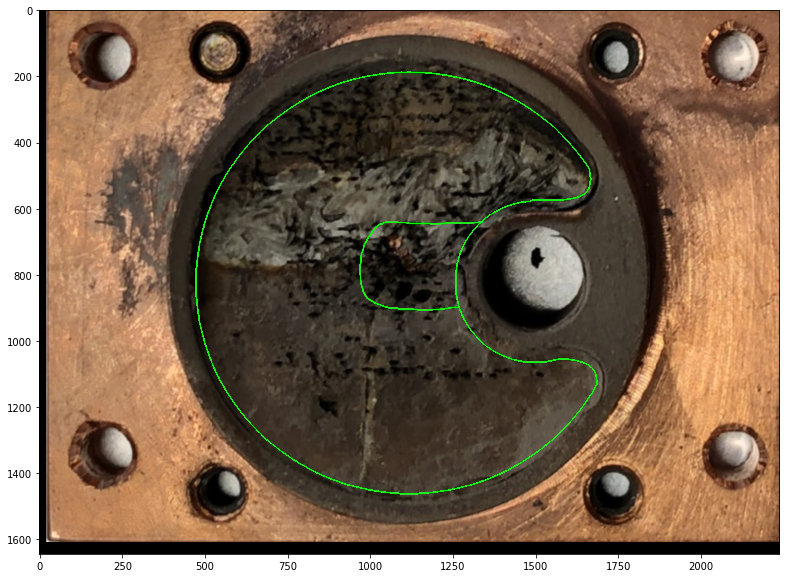

In [33]:
target_outline_used = cv2.imread('target_outline_used.jpg',1)
target_outline_used = cv2.cvtColor(target_outline_used, cv2.COLOR_BGR2RGB)
fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(target_outline_used)
cv2.imwrite("target_outline_badpartsremoved.jpg", cv2.cvtColor(target_outline_used, cv2.COLOR_RGB2BGR))

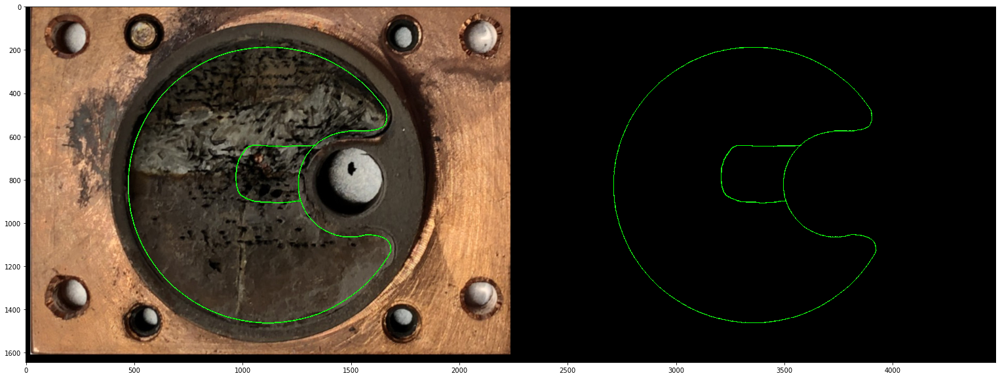

In [34]:
# red line has R=22,G=242,B=22
boundaries = [
    ([0, 200, 0], [50, 255, 50]),
]

# loop over the boundaries
for (lower, upper) in boundaries:
    # create NumPy arrays from the boundaries
    lower = np.array(lower, dtype = "uint8")
    upper = np.array(upper, dtype = "uint8")

    # find the colors within the specified boundaries and apply
    # the mask
    mask = cv2.inRange(target_outline_used, lower, upper)
    output_target = cv2.bitwise_and(target_outline_used, target_outline_used, mask = mask)

    # show the images
    fig, ax = plt.subplots(figsize = (30,10))
    ax.imshow(np.hstack([target_outline_used, output_target]))

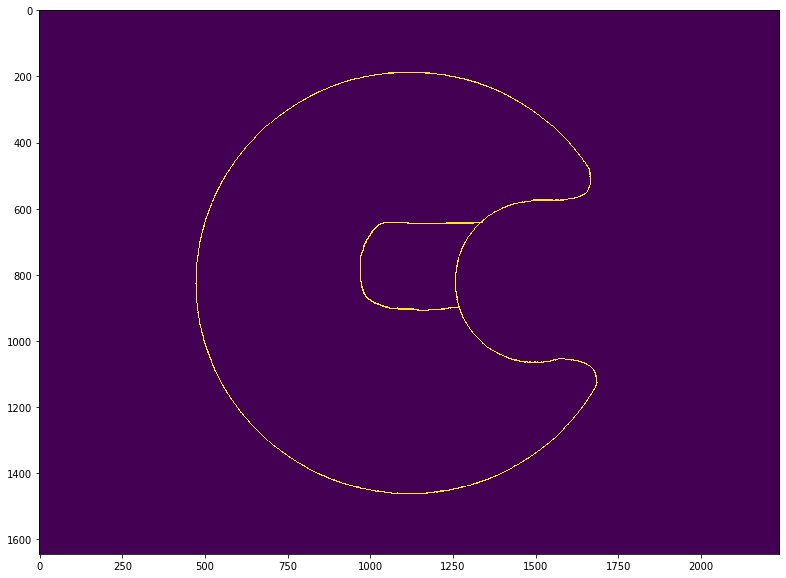

In [35]:
output_target_grey = cv2.cvtColor(output_target, cv2.COLOR_RGB2GRAY)
output_target_grey[output_target_grey != 0] = 255
ret,thresh_target = cv2.threshold(output_target_grey,10,255,cv2.THRESH_BINARY)

fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(thresh_target)

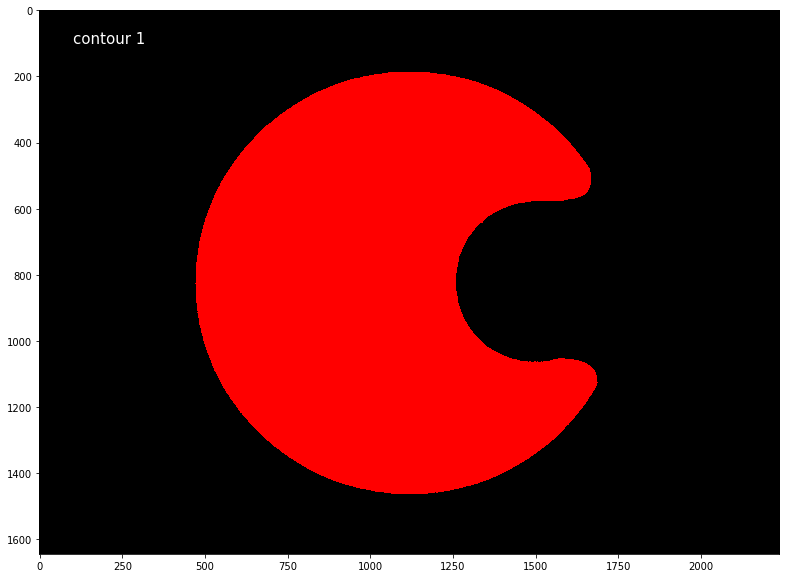

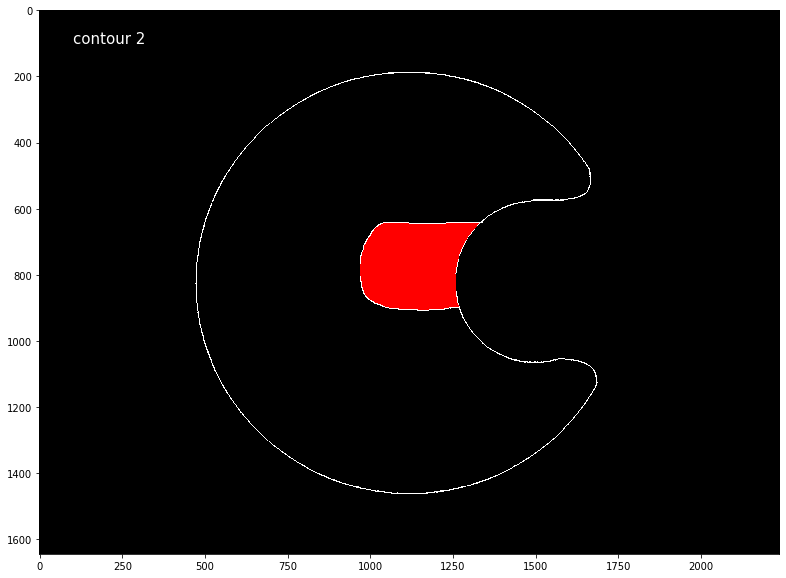

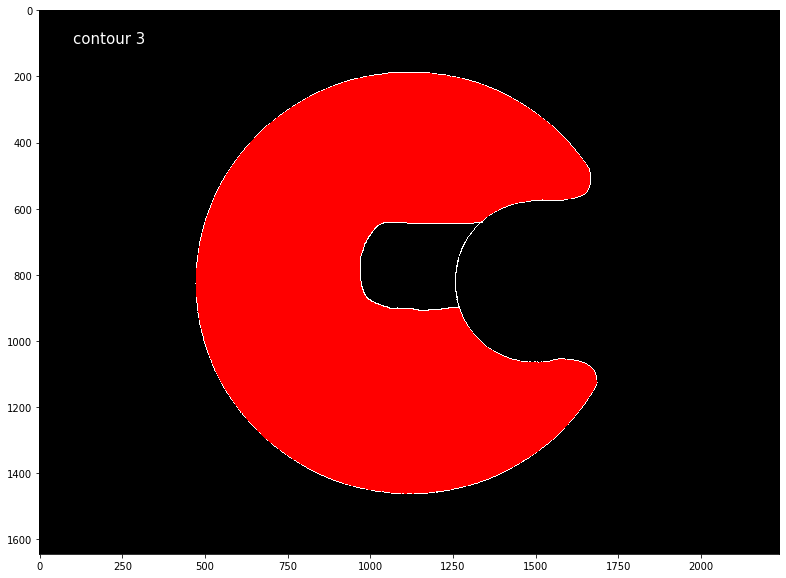

In [36]:
contours_target, hierarchy = cv2.findContours(thresh_target.copy(),cv2.RETR_CCOMP,cv2.CHAIN_APPROX_NONE )
for idc, contour in enumerate(contours_target):
    if len(contour) > 100:
        im = cv2.drawContours(cv2.cvtColor(thresh_target, cv2.COLOR_GRAY2RGB).copy(), [contour], -1, (255,0,0), thickness = -1)
        fig, ax = plt.subplots(figsize = (15,10))
        ax.imshow(im)
        ax.text(100,100, "contour {0}".format(idc+1), color = 'w', fontsize = 15)

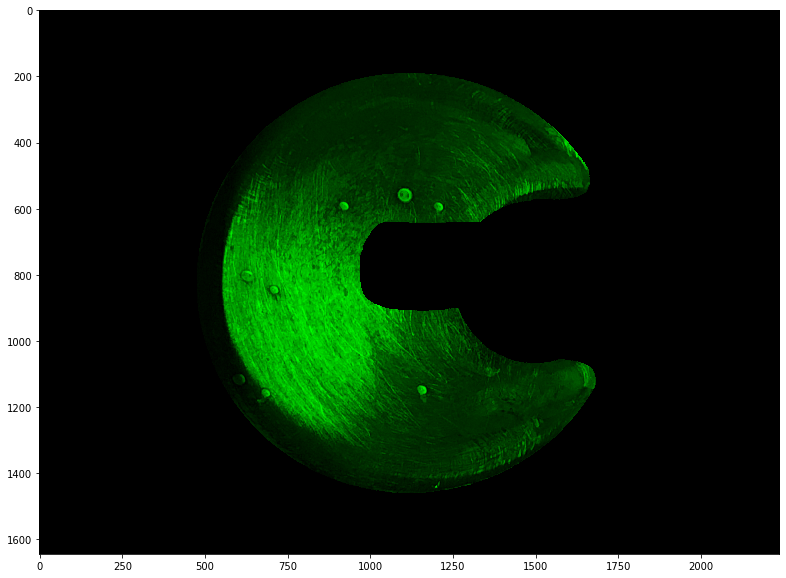

In [37]:
im = np.zeros(np.shape(output), dtype = 'float32')
im2 = im.copy()

im = cv2.drawContours(im, [contours[-1]], -1, (0,255,0), thickness = -1)
im2 = cv2.drawContours(im2, [contours_target[1]],-1,(0,255,0), thickness = -1)
im[im2 == 255] = 0
im[thresh_target == 255] = 0

cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)

fig, ax = plt.subplots(figsize = (15,10))
ax.imshow(trace1_edge & im.astype(int))

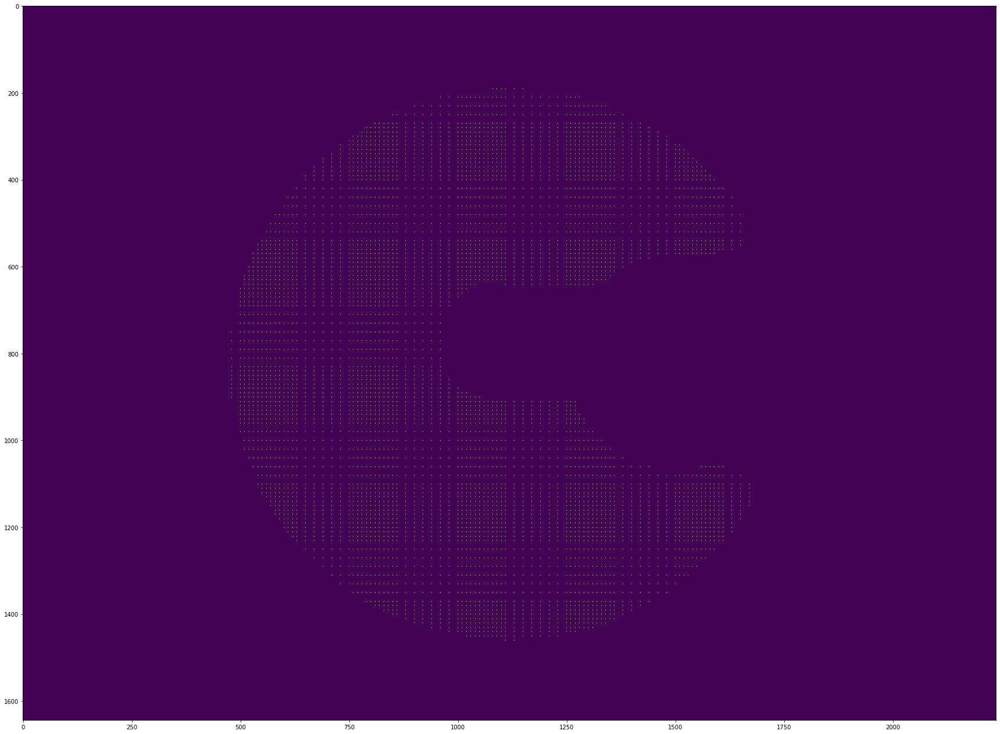

In [38]:
im = cv2.cvtColor(im, cv2.COLOR_RGB2GRAY)
dpx = 10
grid = np.zeros(im.shape)
for idy in range(0,im.shape[0],dpx):
    for idx in range(0,im.shape[1],dpx):
        grid[idy,idx] = 125
fig, ax = plt.subplots(figsize = (30,25))
ax.imshow(im.astype(int) & grid.astype(int))

In [39]:
coords = np.where((im.astype(int) & grid.astype(int)) != 0)
yspots, xspots = coords
coords = np.vstack((xspots,yspots, np.ones(len(yspots)))).T

coords_ysweep = coords[coords[:,0].argsort()]
coords_xsweep = coords.copy()

In [40]:
coords_mirror = np.einsum('ij,kj->ki', transform, coords_xsweep)

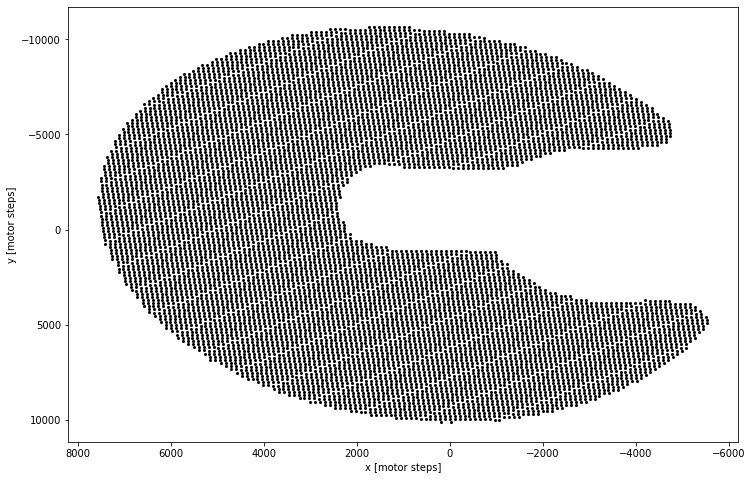

In [41]:
fig, ax = plt.subplots(figsize = (12,8))
ax.plot(coords_mirror[:,1], coords_mirror[:,0], 'k.', ms = 4)
ax.invert_yaxis()
ax.invert_xaxis()
ax.set_xlabel('x [motor steps]')
ax.set_ylabel('y [motor steps]')
fig.savefig('ablation_spots.jpeg')

Adding point to prevent sweep from hitting hole in target.

In [42]:
sweepdata = coords_mirror.copy()
sweepdata = sweepdata[:,[1,0]]

In [43]:
import h5py
with h5py.File("ablation_sweeps_february2019.sweep_hdf5", "a") as f:
    dset = f.create_dataset('sweep01', data = sweepdata.round().astype(int))

## Correction found from `Fluorescence Signals Target Scan.ipynb` in `CeNTREX-notebooks/rotational cooling/`
Pumping down in combination with the big bellows (iso160), causes the beamsource to shift slightly, necessitating a shift in mirror coordinates to compensate

In [44]:
coords_xsweep[:,0] += 270
coords_mirror = np.einsum('ij,kj->ki', transform, coords_xsweep)

sweepdata = coords_mirror.copy()
sweepdata[:,1]
sweepdata = sweepdata[:,[1,0]]

In [45]:
import h5py
with h5py.File("ablation_sweeps_february2019_corrected.sweep_hdf5", "a") as f:
    dset = f.create_dataset('sweep01', data = sweepdata.round().astype(int))

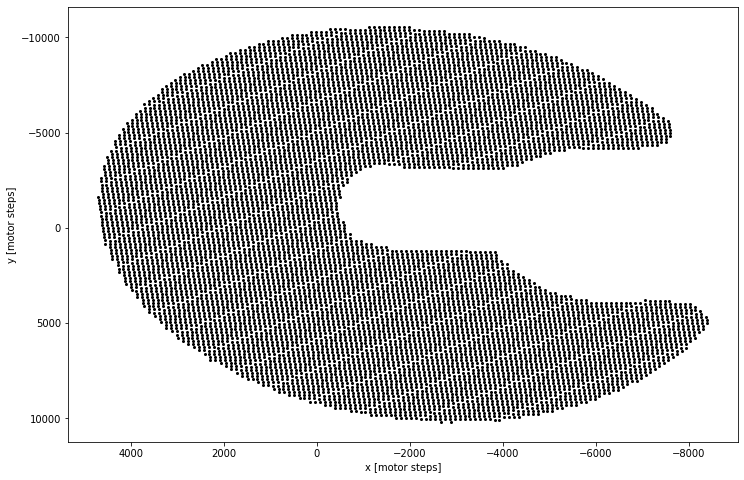

In [48]:
fig, ax = plt.subplots(figsize = (12,8))
ax.plot(coords_mirror[:,1], coords_mirror[:,0], 'k.', ms = 4)
ax.invert_yaxis()
ax.invert_xaxis()
ax.set_xlabel('x [motor steps]')
ax.set_ylabel('y [motor steps]');